In [1]:
import os
import sys
from pathlib import Path

import anndata as ad
import cv2 as cv
import h5py
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from joblib import Parallel, delayed
from matplotlib.pyplot import rc_context
from skimage import exposure, io
from skimage.util import img_as_ubyte
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from tqdm.notebook import tqdm, trange

sc.settings.verbosity = 3

In [2]:
p_dir = (Path().cwd().parents[0]).absolute()
data_dir = p_dir / "data"

In [3]:
%load_ext autoreload
%autoreload 2

module_path = str(p_dir / "src")

if module_path not in sys.path:
    sys.path.append(module_path)

import scanorama
import utils as my_utils

In [4]:
experiment = "Lung"
cores = ['B5', 'C6', 'D4', 'E4', 'E6', 'F4']
# datasets = [f'{core}_{i}' for core in cores for i in range(1,5)] + ['F7_3', 'F7_4']

# Load data

In [5]:
def read_props(dataset, experiment):
    df_morph = pd.read_csv(data_dir / "props" / f"morphology_IMC_{experiment}_{dataset}.csv")
    df_intensity_IMC = pd.read_csv(data_dir / "props" / f"intensity_IMC_{experiment}_{dataset}.csv")
    df_intensity_TS = pd.read_csv(data_dir / "props" / f"intensity_TS_{experiment}_{dataset}.csv")

    return df_morph, df_intensity_IMC, df_intensity_TS

In [6]:
adatas = []
for dataset in datasets:
    try:
        df_morph, df_intensity_IMC, df_intensity_TS = read_props(dataset, experiment)
        print(f'Sucessfully read dataset {dataset}') 
    except:
        print(f'{dataset} cannot be read') 
        continue
    df_intensity_TS.drop(['Rest', 'Total'], axis=1, inplace=True)
    # df_intensity_TS.iloc[:, 1:] = df_intensity_TS.iloc[:, 1:].multiply(
    #     df_morph["area"], axis=0
    # )
    pseudo_count=1
    data_all = df_intensity_TS.iloc[:, 1:].values
    data_all_norm = (data_all+pseudo_count)/(np.percentile(data_all,50,axis=1,keepdims=True)+pseudo_count)
    data_all_norm = MinMaxScaler().fit_transform(data_all_norm)
    df_intensity_TS.iloc[:, 1:] = data_all_norm

    # Merge TS and IMC data
    df = df_intensity_IMC.merge(df_intensity_TS, on="Id")
    df.set_index("Id", inplace=True)
    
    # Put into adata format
    adata = sc.AnnData(df.values)
    adata.var_names = df.columns.tolist()
    adata.obs["Cell"] = df.index.tolist()
    adata.obs["Dataset"] = dataset
    adata.obs["Core"] = dataset.split("_")[0]
    adata.obsm["spatial"] = df_morph[["centroid-0", "centroid-1"]].to_numpy()
    adatas.append(adata)

adata = ad.concat(adatas, join="inner")

Sucessfully read dataset B5_1
Sucessfully read dataset B5_2


C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset B5_3
B5_4 cannot be read
Sucessfully read dataset C6_1


C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset C6_2


C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset C6_3


C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset C6_4
Sucessfully read dataset D4_1


C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset D4_2
Sucessfully read dataset D4_3
D4_4 cannot be read


C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset E4_1
Sucessfully read dataset E4_2


C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


Sucessfully read dataset E4_3
Sucessfully read dataset E4_4


C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future b

Sucessfully read dataset E6_1
Sucessfully read dataset E6_2
Sucessfully read dataset E6_3
E6_4 cannot be read
Sucessfully read dataset F4_1


C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future b

Sucessfully read dataset F4_2
Sucessfully read dataset F4_3


C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)


F4_4 cannot be read
Sucessfully read dataset F7_3
Sucessfully read dataset F7_4


C:\Users\thu71\AppData\Local\Temp/ipykernel_27620/31878018.py:24: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = sc.AnnData(df.values)
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [15]:
IMC_markers = df_intensity_IMC.columns[1:]
SIMS_masses = df_intensity_TS.columns[1:]

In [16]:
IMC_markers

Index(['CD11b', 'CD11c', 'CD20', 'CD3', 'CD31', 'CD4', 'CD44', 'CD45RA',
       'CD45RO', 'CD68', 'CD8', 'COL1', 'DNA1', 'DNA2', 'ECadherin', 'FoxP3',
       'GranzymeB', 'HistoneH3', 'Ki67', 'MHCII', 'PanKeratin', 'SMA',
       'Vimentin'],
      dtype='object')

In [17]:
IMC_markers = IMC_markers.drop(["CD11b", "CD11c", 'FoxP3', "DNA1", "DNA2", "HistoneH3", 'MHCII', 'CD45RO', 'CD45RA'])

In [18]:
# masks = get_masks(data_dir / "masks")

# for dataset in datasets:
#     adata_subset = adata[adata.obs.Dataset == dataset, :]
#     mask = masks[experiment + '_' + dataset]
    
#     # Get label2cell dict
#     cell_id =  adata_subset.obs.Cell.to_list()
#     mask_cell = np.where(np.isin(mask, cell_id), mask, 0)

In [19]:
IMC_markers

Index(['CD20', 'CD3', 'CD31', 'CD4', 'CD44', 'CD68', 'CD8', 'COL1',
       'ECadherin', 'GranzymeB', 'Ki67', 'PanKeratin', 'SMA', 'Vimentin'],
      dtype='object')

# IMC cell phenotype

## Data ingegration

In [20]:
adata_IMC = adata[:, IMC_markers]
sc.pp.scale(adata_IMC, max_value=4)


C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\scanpy\preprocessing\_simple.py:843: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)
C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [21]:
# alldata = {}
# for batch in adata_IMC.obs["Dataset"].unique():
#     alldata[batch] = adata_IMC[
#         adata_IMC.obs["Dataset"] == batch,
#     ]

# # convert to list of AnnData objects
# adatas = list(alldata.values())

# # run scanorama.integrate
# scanorama.integrate_scanpy(adatas, dimred=15)

In [22]:
alldata = {}
for batch in adata_IMC.obs["Core"].unique():
    adata_subset = adata_IMC[
        adata_IMC.obs["Core"] == batch,
    ]
    alldata[batch] = adata_subset

# convert to list of AnnData objects
adatas = list(alldata.values())

# run scanorama.integrate
scanorama.integrate_scanpy(adatas, dimred=10)

Found 14 genes among all datasets
[[0.         0.78408304 0.42800476 0.32629758 0.36357243 0.33391003
  0.3196347 ]
 [0.         0.         0.32844109 0.26497639 0.1835443  0.5314442
  0.60730594]
 [0.         0.         0.         0.60134867 0.77637131 0.64339548
  0.28956763]
 [0.         0.         0.         0.         0.60970464 0.27835052
  0.53333333]
 [0.         0.         0.         0.         0.         0.48874824
  0.29746835]
 [0.         0.         0.         0.         0.         0.
  0.65022831]
 [0.         0.         0.         0.         0.         0.
  0.        ]]
Processing datasets (0, 1)
Processing datasets (2, 4)
Processing datasets (5, 6)
Processing datasets (2, 5)
Processing datasets (3, 4)
Processing datasets (1, 6)
Processing datasets (2, 3)
Processing datasets (3, 6)
Processing datasets (1, 5)
Processing datasets (4, 5)
Processing datasets (0, 2)
Processing datasets (0, 4)
Processing datasets (0, 5)
Processing datasets (1, 2)
Processing datasets (0, 3)
Pro

C:\Users\thu71\Anaconda3\envs\new_codex\lib\site-packages\anndata\_core\anndata.py:1828: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [23]:
# Get all the integrated matrices.
scanorama_int = [ad.obsm["X_scanorama"] for ad in adatas]

# make into one matrix.
all_s = np.concatenate(scanorama_int)
print(all_s.shape)

# add to the AnnData object
adata_IMC.obsm["Scanorama"] = all_s

(19507, 10)


In [24]:
sc.pp.neighbors(adata_IMC, use_rep="Scanorama")
sc.tl.umap(adata_IMC)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:22)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:10)


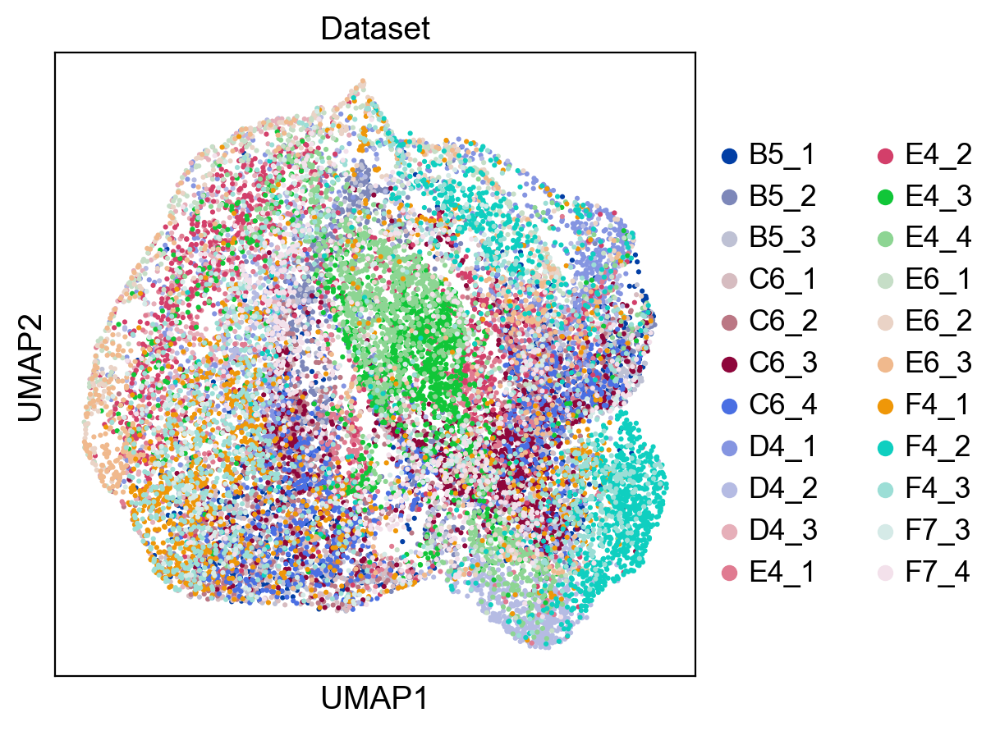

In [25]:
sc.set_figure_params(format="png")

with rc_context({"figure.figsize": (5, 5), "figure.dpi": 100}):
    fig = sc.pl.umap(adata_IMC, color=["Dataset"], size=20)

In [22]:
# sc.tl.tsne(adata_IMC, use_rep="Scanorama")

In [23]:
# sc.set_figure_params(format="png")

# with rc_context({"figure.figsize": (7, 7), "figure.dpi": 100}):
#     fig = sc.pl.tsne(adata_IMC, color=["Dataset"], size=20)

## Clustering

In [26]:
sc.pp.neighbors(adata_IMC, use_rep="Scanorama", metric='cosine')
sc.tl.leiden(adata_IMC, resolution=0.5)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:05)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:02)


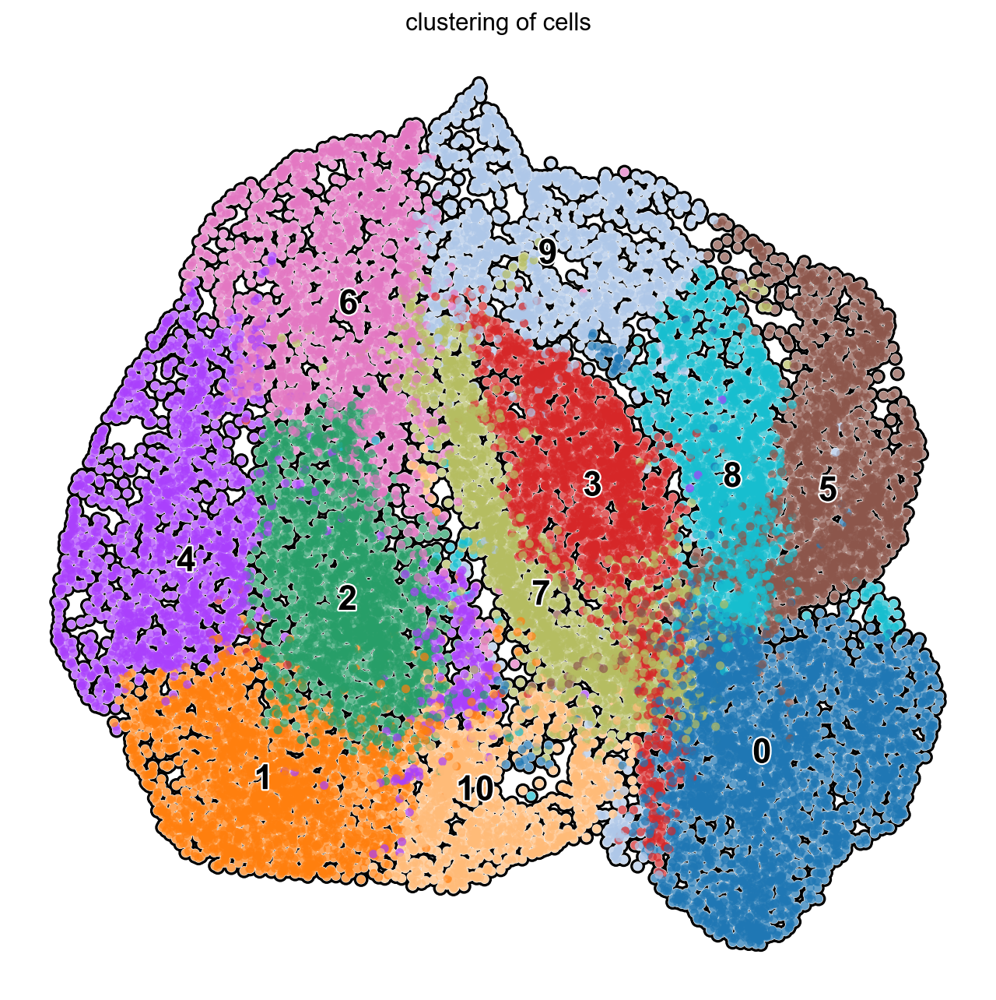

In [27]:
with rc_context({"figure.figsize": (10, 10)}):
    sc.pl.umap(
        adata_IMC,
        color=["leiden"],
        size=100,
        legend_loc="on data",
        add_outline=True,
        legend_fontsize=20,
        legend_fontoutline=2,
        frameon=False,
        title="clustering of cells",
    )

In [28]:
sc.tl.dendrogram(adata_IMC, groupby='leiden')


    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_leiden']`


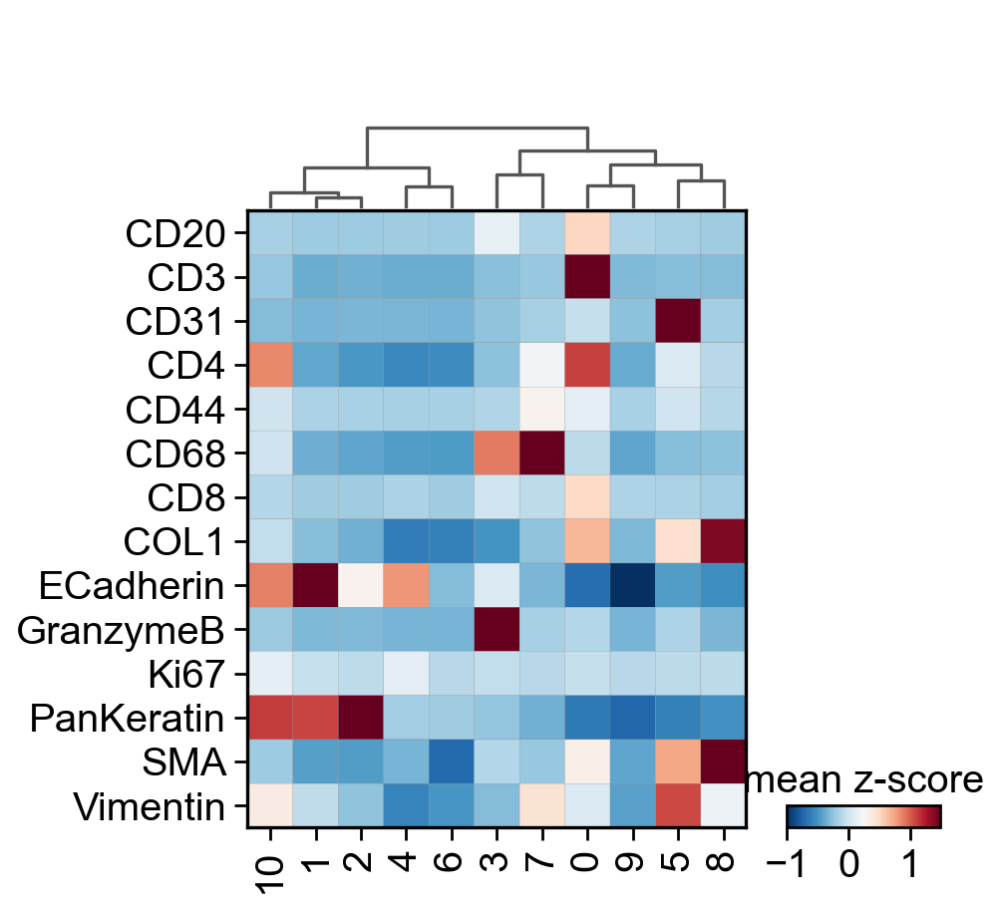

In [30]:
sns.set_context("notebook", font_scale=1.8)
sc.pl.matrixplot(
    adata_IMC,
    adata_IMC.var_names.tolist(),
    "leiden",
    dendrogram=True,
    colorbar_title="mean z-score",
    cmap="RdBu_r",
    swap_axes=True,
    vmax=1.5,
    vmin=-1
)

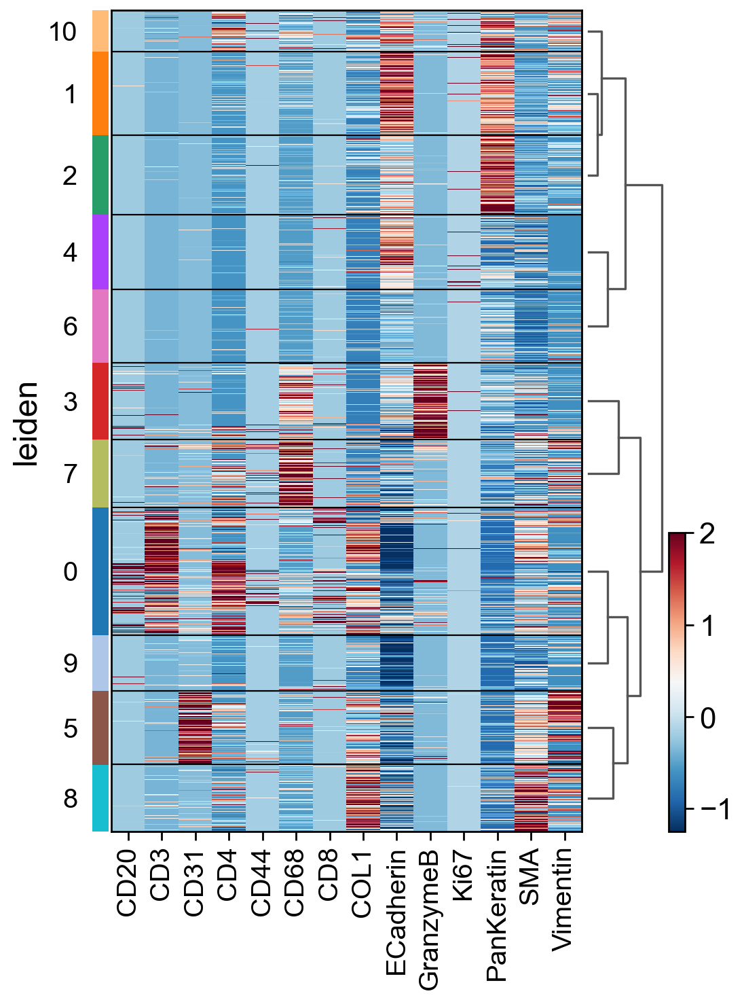

In [32]:
sc.pl.heatmap(
    adata_IMC,
    adata_IMC.var_names.tolist(),
    "leiden",
    dendrogram=True,
    cmap="RdBu_r",
    figsize=(7, 10),
    vmax=2
)

In [41]:
cluster_label_order = adata_IMC.uns['dendrogram_leiden']['categories_ordered']

In [42]:
import matplotlib 

colors = adata_IMC.uns["leiden_colors"]
labels = adata_IMC.obs.leiden.cat.categories.tolist()

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

colors_rgb_dict = {k:v for k,v in zip(labels, colors_rgb)}

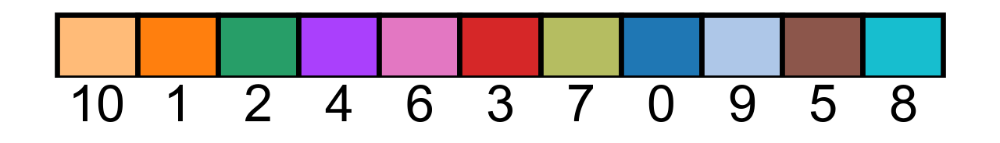

In [44]:
# legend
c=np.array([colors_rgb_dict[i] for i in cluster_label_order])

fig, ax = plt.subplots(figsize=(10,0.7))
ax.bar(x=cluster_label_order, 
        color=c/255,
        width=1, 
        height=1,
        edgecolor='k',
        linewidth=3,
       )
_ = plt.xticks(range(len(colors_rgb_dict.values())), cluster_label_order, rotation=0, size=30)
_ = plt.yticks([])
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
ax.grid(False)


## Cluster results 

In [45]:
from typing import List
import matplotlib
import skimage
from skimage import measure

# Read mask image
def get_masks(mask_folder):
    """
    Function to get all mask from mask forlder
    """
    # Read masks
    masks = {}

    for (dirpath, dirnames, filenames) in os.walk(mask_folder):
        for name in sorted(filenames):
            if "tif" in name:
                filename = os.path.join(dirpath, name)
                img = skimage.io.imread(filename)
                condition = name.split(".")[0]
                masks[condition] = img
            else:
                continue
    return masks


def create_clustered_cell(mask, label2cell, my_cmap, **kwargs):
    img = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)

    for i, cells in tqdm(label2cell.items(), total=len(label2cell)):
        rows, cols = np.where(np.isin(mask, cells))
        img[rows, cols, :] = my_cmap[int(i)]

    return img

def get_contour(mask: np.ndarray) -> List[List[float]]:
    """
    Get contours of mask
    """
    contours = []
    for i in sorted(np.unique(mask)):
        if i == 0:
            continue
        contours.append(measure.find_contours(mask == i, 0.8)[0])

    return contours

In [46]:
masks = get_masks(data_dir / "masks")

In [47]:
df_test = pd.DataFrame()
df_test["Dataset"] = adata_IMC.obs["Core"].tolist()
df_test["Clusters"] = adata_IMC.obs["leiden"].tolist()

In [48]:
clusters = df_test["Clusters"].unique().tolist()
clusters.sort(key=int)

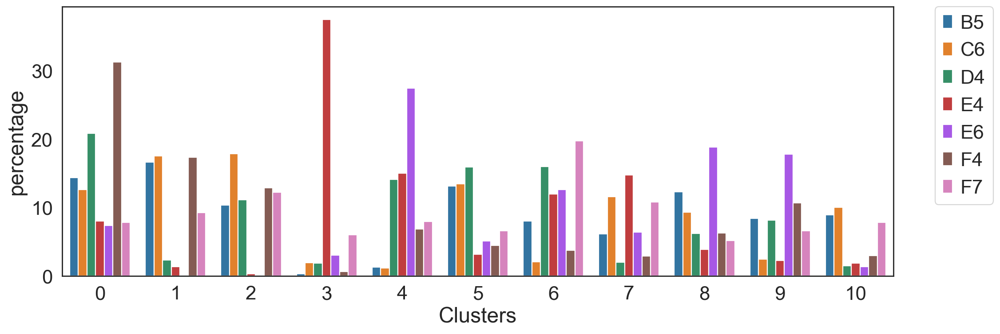

In [49]:
df_test_grouped = (
    df_test.groupby("Dataset")["Clusters"]
    .value_counts(normalize=True)
    .rename("percentage")
    .mul(100)
    .reset_index()
)
with sns.axes_style("white"):
    sns.barplot(
        data=df_test_grouped,
        x="Clusters",
        y="percentage",
        hue="Dataset",
        order=[i for i in clusters],
    )
    plt.gcf().set_size_inches(15, 5)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0)


In [50]:
colors = adata_IMC.uns["leiden_colors"]
labels = np.unique(adata_IMC.obs.leiden.tolist())

colors_rgb = []
for color in colors:
    colors_rgb.append(matplotlib.colors.hex2color(color))
colors_rgb = np.array(colors_rgb) * 255
colors_rgb = colors_rgb.astype(np.uint8)

B5_1


  0%|          | 0/11 [00:00<?, ?it/s]

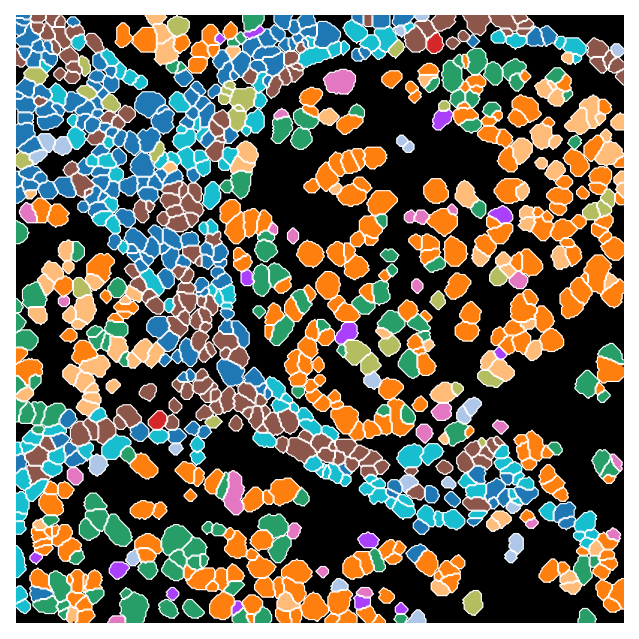

B5_2


  0%|          | 0/11 [00:00<?, ?it/s]

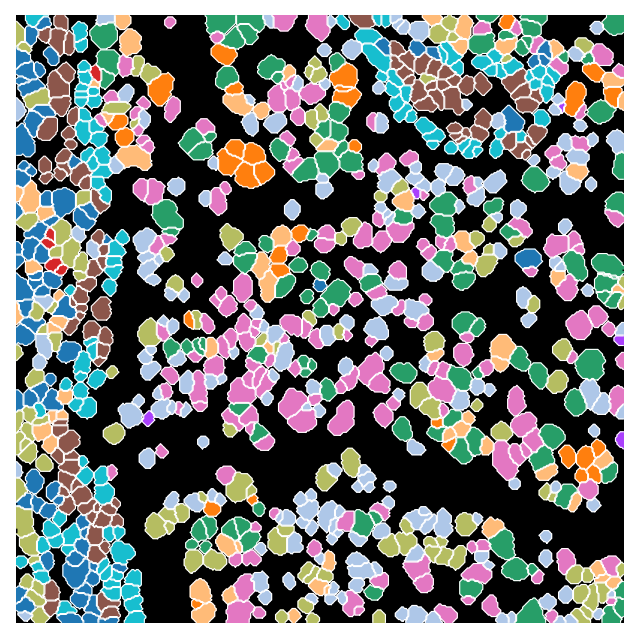

B5_3


  0%|          | 0/11 [00:00<?, ?it/s]

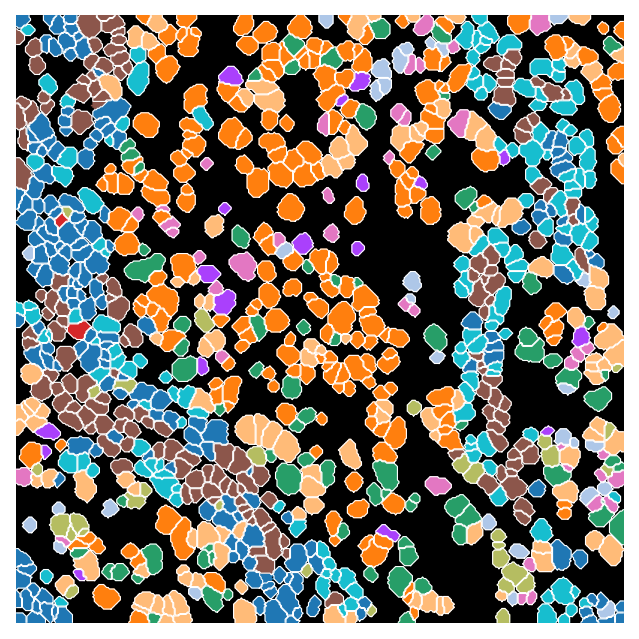

B5_4 cannot be read
C6_1


  0%|          | 0/11 [00:00<?, ?it/s]

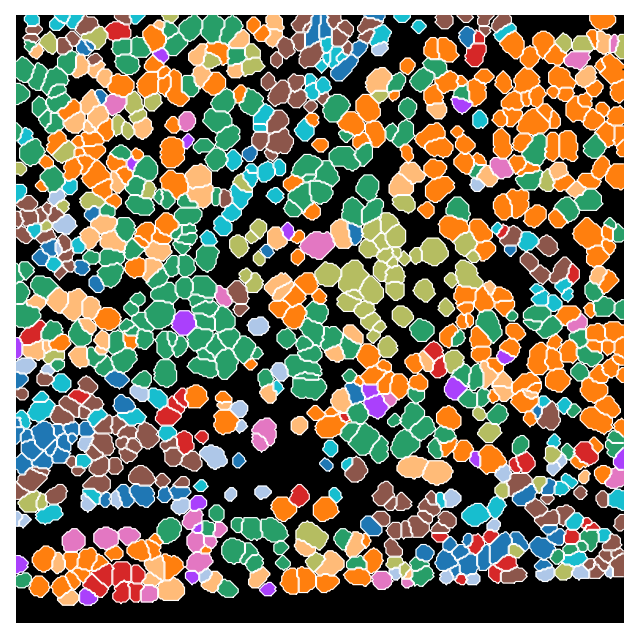

C6_2


  0%|          | 0/11 [00:00<?, ?it/s]

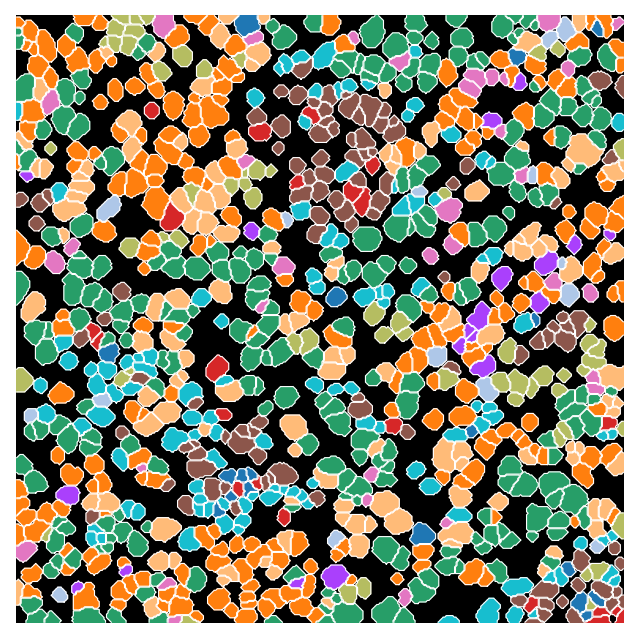

C6_3


  0%|          | 0/11 [00:00<?, ?it/s]

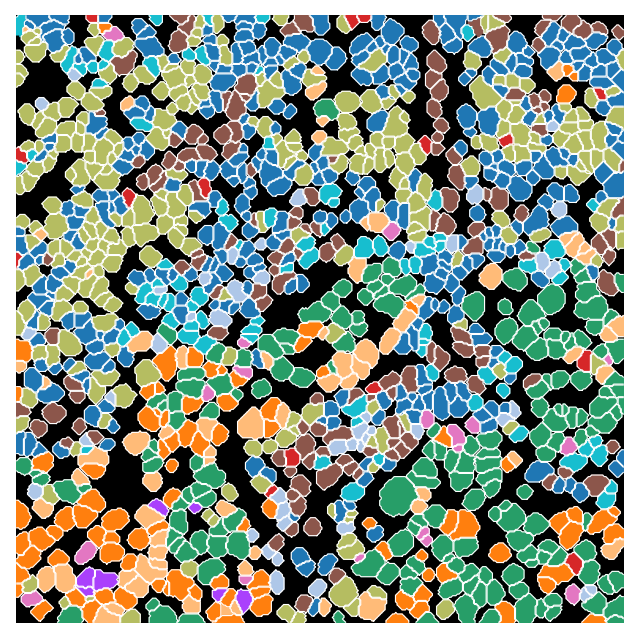

C6_4


  0%|          | 0/11 [00:00<?, ?it/s]

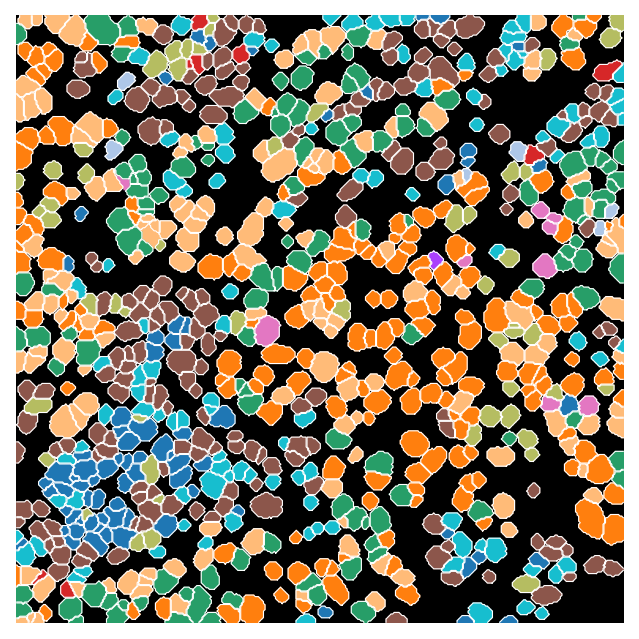

D4_1


  0%|          | 0/11 [00:00<?, ?it/s]

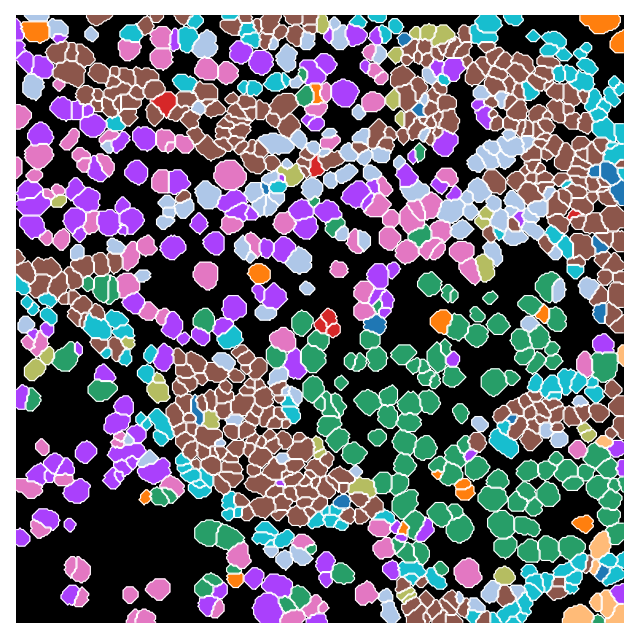

D4_2


  0%|          | 0/11 [00:00<?, ?it/s]

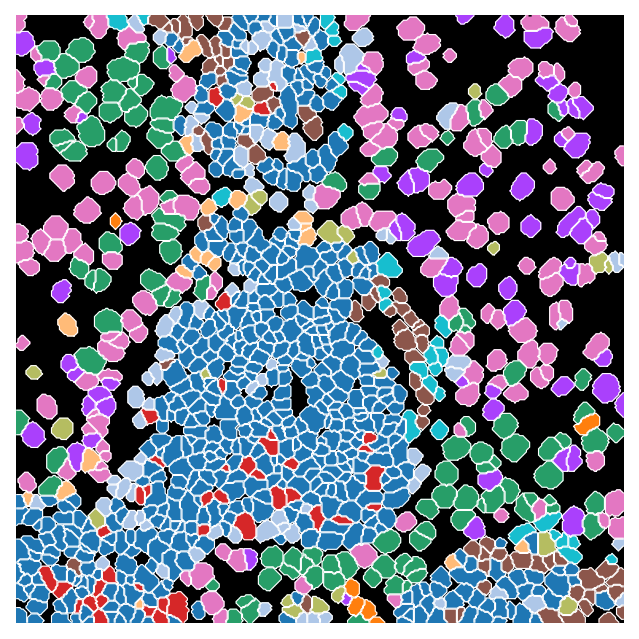

D4_3


  0%|          | 0/11 [00:00<?, ?it/s]

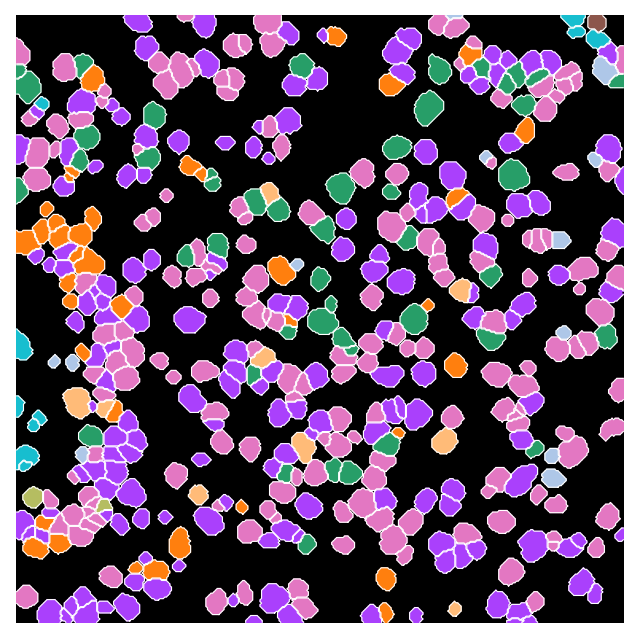

D4_4 cannot be read
E4_1


  0%|          | 0/11 [00:00<?, ?it/s]

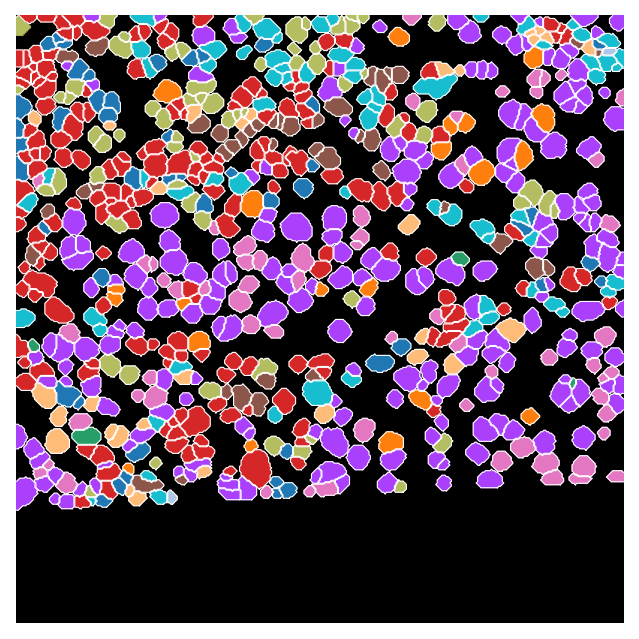

E4_2


  0%|          | 0/11 [00:00<?, ?it/s]

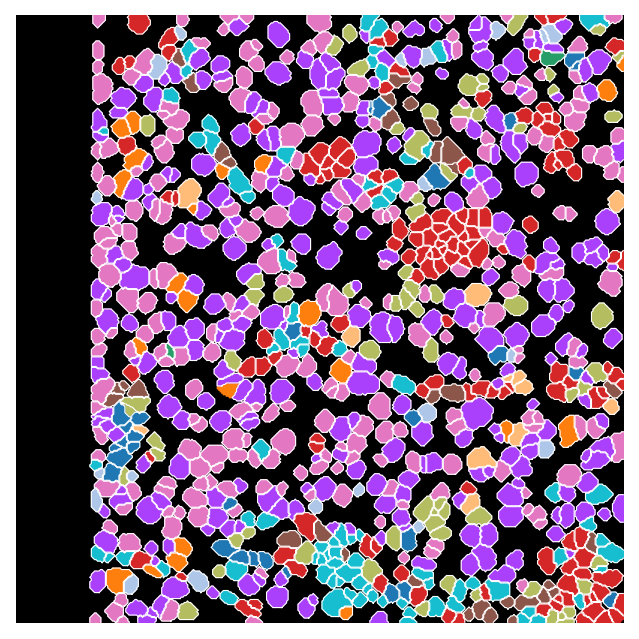

E4_3


  0%|          | 0/11 [00:00<?, ?it/s]

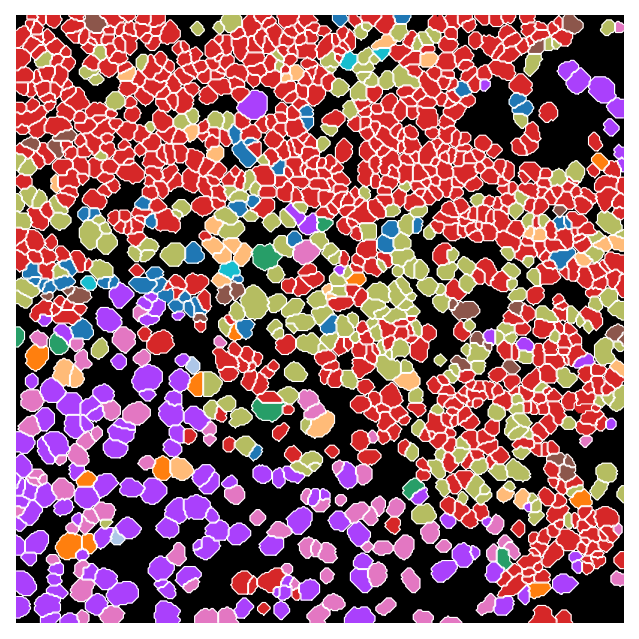

E4_4


  0%|          | 0/11 [00:00<?, ?it/s]

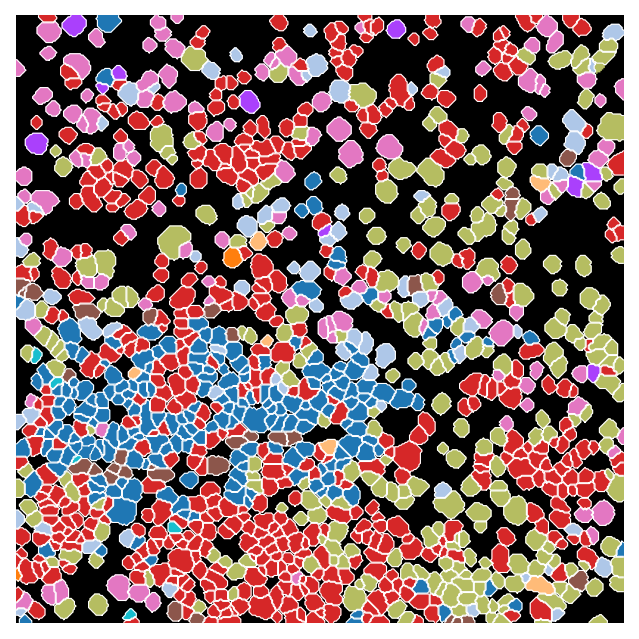

E6_1


  0%|          | 0/11 [00:00<?, ?it/s]

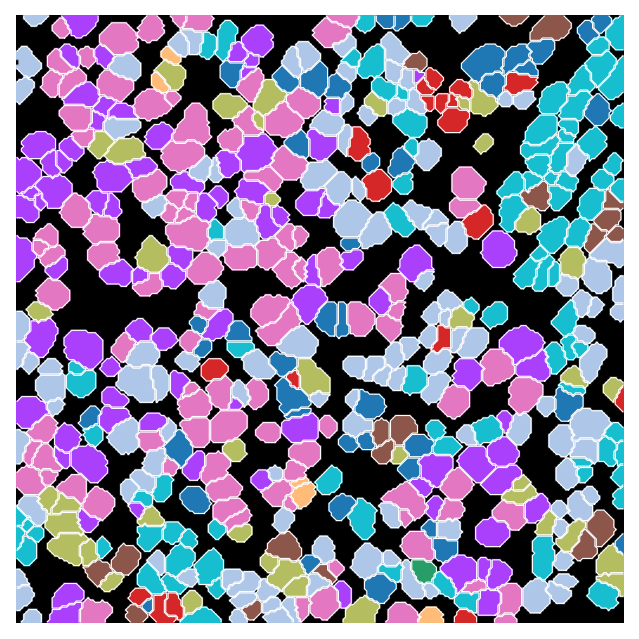

E6_2


  0%|          | 0/11 [00:00<?, ?it/s]

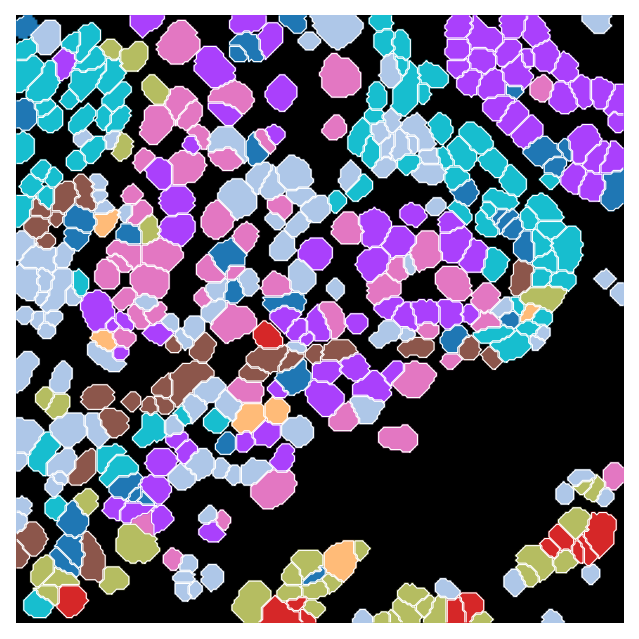

E6_3


  0%|          | 0/11 [00:00<?, ?it/s]

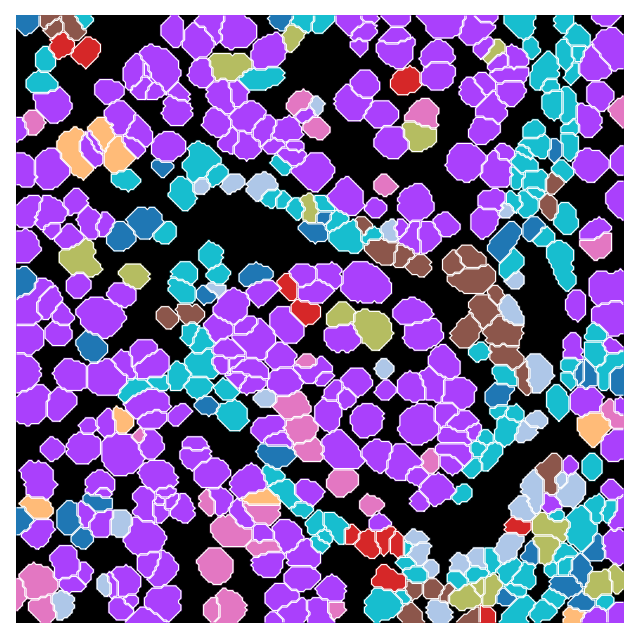

E6_4 cannot be read
F4_1


  0%|          | 0/11 [00:00<?, ?it/s]

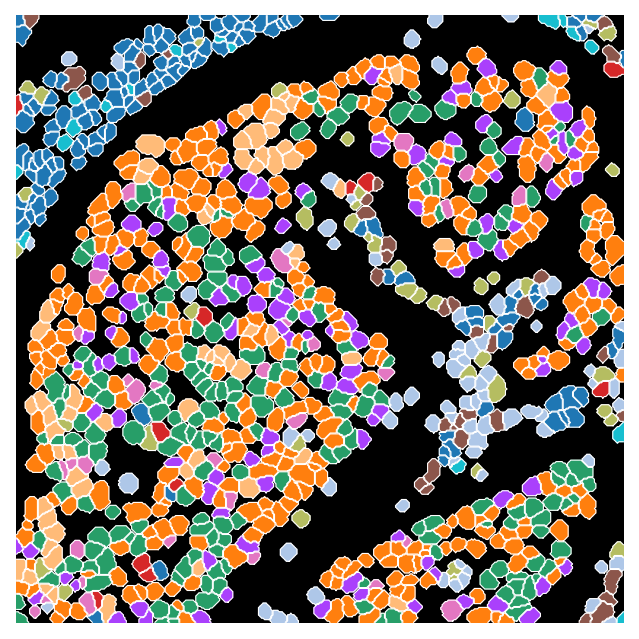

F4_2


  0%|          | 0/11 [00:00<?, ?it/s]

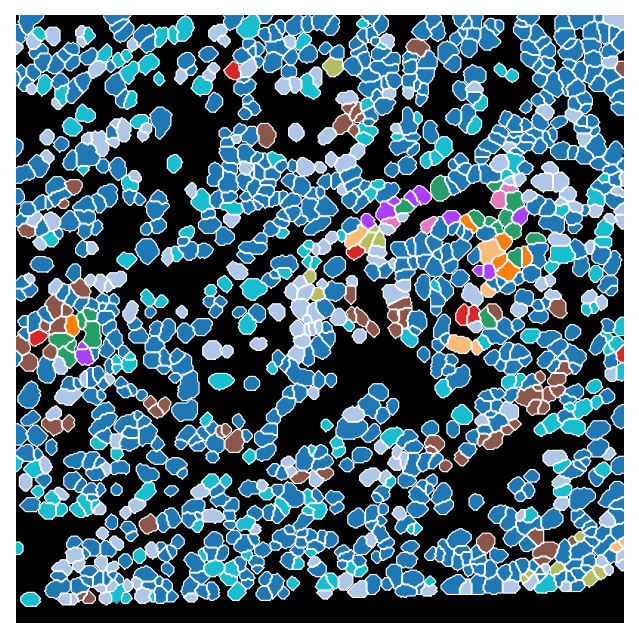

F4_3


  0%|          | 0/11 [00:00<?, ?it/s]

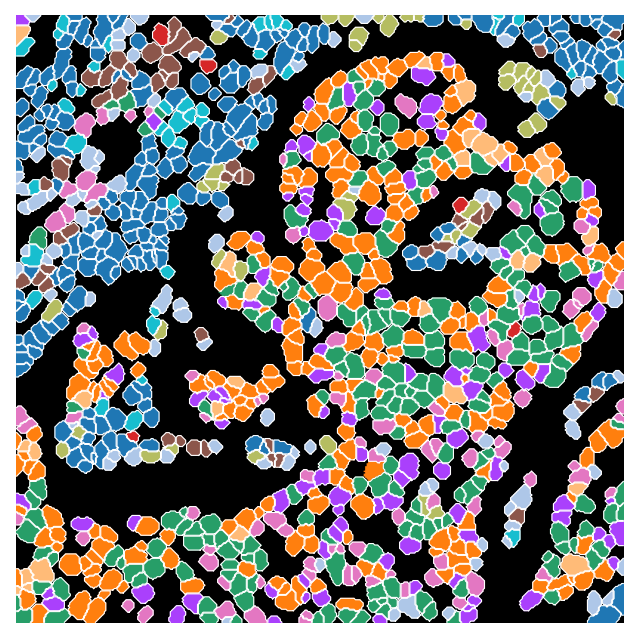

F4_4 cannot be read
F7_3


  0%|          | 0/11 [00:00<?, ?it/s]

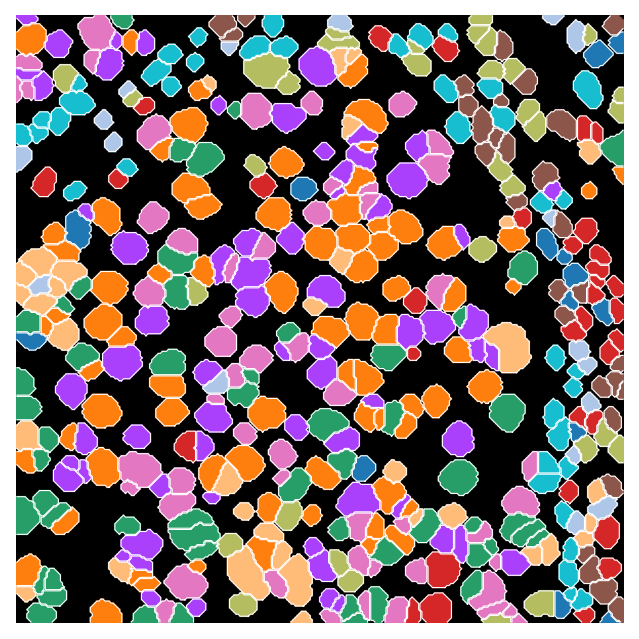

F7_4


  0%|          | 0/11 [00:00<?, ?it/s]

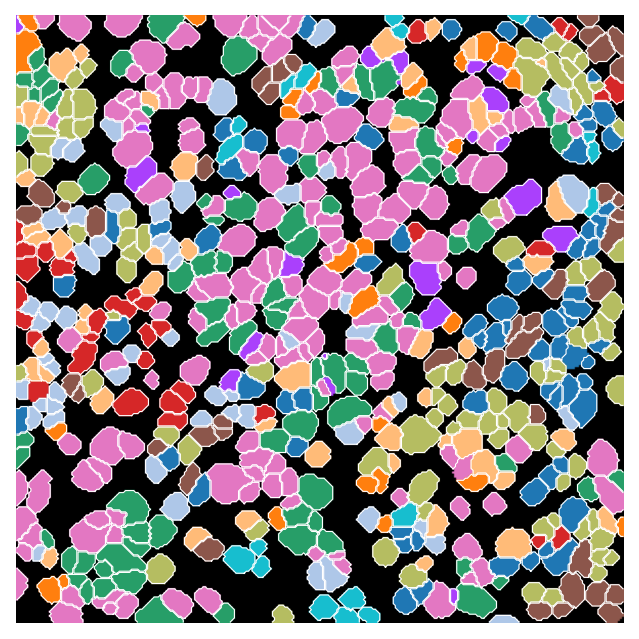

In [51]:
experiment = 'Lung'

for dataset in datasets:
    try:
        adata_subset = adata_IMC[adata_IMC.obs.Dataset == dataset, :]
        mask = masks[experiment + '_' + dataset]
        contours = get_contour(mask)
    except:
        print(f'{dataset} cannot be read') 
        continue
    
    print(f'{dataset}') 
    # Get label2cell dict
    label2cell = {}
    for l in labels:
        cell_id = adata_subset[adata_subset.obs.leiden == l].obs.Cell.to_list()
        label2cell[l] = cell_id

    img = create_clustered_cell(mask, label2cell, colors_rgb)

    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(img)
    for j, contour in enumerate(contours):
        ax.plot(contour[:, 1], contour[:, 0], linewidth=0.5, color="white")
    ax.axis("off")
    plt.show()

In [52]:
path = data_dir / "adata" / f"{experiment}_2.h5ad"
adata_IMC.write(path)
